### Dans ce notebook nous verrons comment reconstruire de A à Z le réseau AESTRA (Auto-Encoding STellar Radial-velocity and Activity) du papier:  
### 
### Liang E., Díaz R. F., Davis A. B., Dumusque X. (2024). AESTRA: Deep Learning for Precise Radial Velocity Estimation in the Presence of Stellar Activity, Astronomy & Astrophysics. https://iopscience.iop.org/article/10.3847/1538-3881/ad0e01/pdf

#### Voici l'architecture en question :

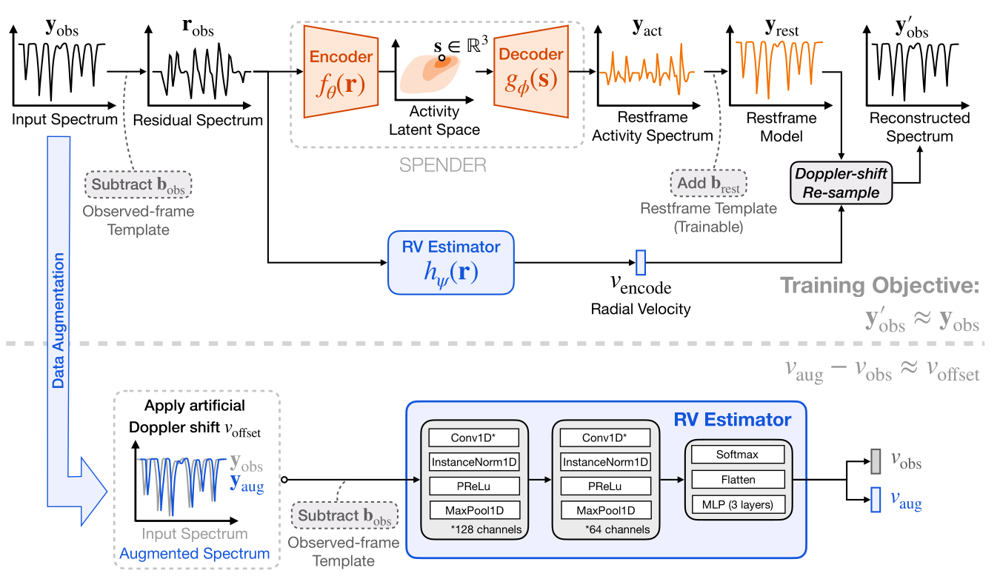

#### Nous nous focaliserons sur cette partie de l'architecture le $ \textit{RV Estimator} $ (Radial Velocity Estimator)

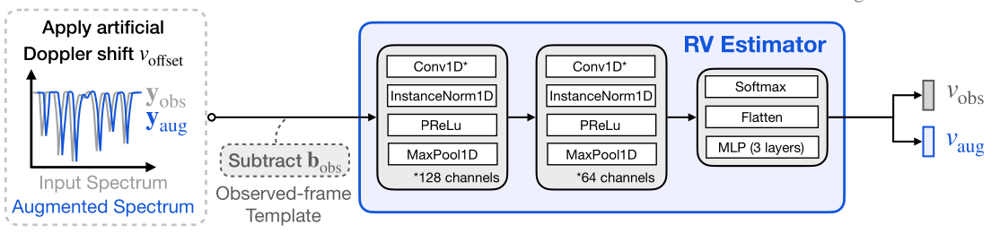

#### Principe d'entraînement : 

On a notre dataset composé d'un ensemble de spectre $y_{\textit{obs}}$.

Pour chaque spectre $y_{\textit{obs, i}}$ :
- On shift le spectre avec une vitesse $v_{\text{offset, i}} \sim \mathcal{U}(-3, 3) , \text{m/s}$ $\rightarrow$ $y_{\text{aug, i}}$
- On soustrait le spectre template $b_{\textit{obs}}$ $\rightarrow$ $y_{\textit{obs, i}} - b_{\textit{obs}} = r_{\textit{obs, i}}$ *
- On envoie ce résidu $r_{\textit{obs}}$ au réseau qui renvoie $\rightarrow$ $\hat{v}_{\textit{obs, i}}$
- On fait de même pour $y_{\textit{aug, i}}$ $\rightarrow$ $\hat{v}_{\textit{aug, i}}$
- On obtient un offset $\hat{v}_{\textit{offset, i}}$
- On compare l'offset obtenu $\hat{v}_{\textit{offset, i}}$ avec l'offset réellement injecté $v_{\textit{offset, i}}$
- On a la loss $\frac{1}{N} \sum \frac{1}{\sigma_v^2} (\hat{v}_{\textit{offset, i}} - v_{\text{offset, i}})^2$

*Dans le papier qui représente le spectre de l'étoile "au repos" sans aucun shift-doppler. Ce spectre est normalement appris quand on entraîne le réseau dans son ensemble mais pour notre cas on prendra un spectre de référence du dataset (stellar_template dans analyse_material.p)

# Imports

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import h5py
from sklearn.model_selection import train_test_split
from torch.utils.data import random_split, Dataset
from torch.utils.data import DataLoader
import pickle
from scipy.interpolate import interp1d
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"On tourne sur {'GPU' if device.type == 'cuda' else 'CPU'}")
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
c = 299792458.
torch.cuda.empty_cache()
torch.cuda.ipc_collect()
from util import cubic_transform

from time import time

On tourne sur GPU


# Chargement des données

Nous utiliserons les spectres du dataset HARPN (YVA car ceux-ci sont corrigés des défaults de HARPN)

Pour cela on crée un dataset personnalisé qui permet de charger plus facilement les spectres

### !! Très important !!

Après de multiples tentatives échouées, un des points essentiels pour faire apprendre le modèle est la **précision numérique** des spectres.

En float32 le shift doppler sur de petites vitesses (de l'ordre de )

In [40]:
def torch_interp(x: torch.Tensor, xp: torch.Tensor, fp: torch.Tensor, dim: int=-1, extrapolate: str='constant') -> torch.Tensor:
    """One-dimensional linear interpolation between monotonically increasing sample
    points, with extrapolation beyond sample points.

    Returns the one-dimensional piecewise linear interpolant to a function with
    given discrete data points :math:`(xp, fp)`, evaluated at :math:`x`.

    Args:
        x: The :math:`x`-from torchcubicspline import natural_cubic_spline_coeffs values, same size as `x`.
    """
    # Move the interpolation dimension to the last axis
    x = x.movedim(dim, -1).contiguous()
    xp = xp.movedim(dim, -1).contiguous()
    fp = fp.movedim(dim, -1).contiguous()
    
    m = torch.diff(fp) / torch.diff(xp) # slope
    b = fp[..., :-1] - m * xp[..., :-1] # offset
    indices = torch.searchsorted(xp, x, right=False)
    
    if extrapolate == 'constant':
        # Pad m and b to get constant values outside of xp range
        m = torch.cat([torch.zeros_like(m)[..., :1], m, torch.zeros_like(m)[..., :1]], dim=-1)
        b = torch.cat([fp[..., :1], b, fp[..., -1:]], dim=-1)
    else: # extrapolate == 'linear'
        indices = torch.clamp(indices - 1, 0, m.shape[-1] - 1)

    values = m.gather(-1, indices) * x + b.gather(-1, indices)
    
    return values.movedim(-1, dim)


In [69]:
class SpectrumDataset(Dataset):

    """
        Charge les spectres du dataset du rv-datachallenge Plato.

        ----- Paramètres d'initialisation -----

        * n_pixel = correspond à L dans AESTRA -> Nb d'échantillons
                                                  Dans AESTRA : 2000

        * lambda_min, lambda_max               -> Bornes inf et sup du domaine du spectre, si None on prend ceux du spectre d'origine
                                                  Dans AESTRA : 5000 - 5050 Å

        
        ----- Variables internes accessibles ----- 

        * self.n_spec, self.n_pixel

        * self.all_specs_numpy         -> ndarray de taille (n_spec, n_pixel)        dtype=float32

        * self.wave_numpy              -> ndarray de taille (n_pixel, )              dtype=float32

        * self.template_spec_numpy     -> ndarray de taille (n_pixel, )              dtype=float32
        
        * self.all_specs_torch         -> tensor de taille [n_spec, n_pixel]         dtype=float32

        * self.wave_torch              -> tensor de taille [n_pixel]                 dtype=float32

        * self.template_spec_torch     -> tensor de taille [n_pixel]                 dtype=float32

        * self.c

        * self.wavelength_step         -> Pas de la grille de longueur d'onde        dtype=float


               
    """
    def __init__(self, n_pixel = 2000, lambda_min=5000., lambda_max=5050.):
        
        # On charge le fichier Analyse_material, celui-ci contient le spectre template et la grille de longueur d'ondes
        with open('STAR1134_HPN_Analyse_material.p', 'rb') as f:
            analyse_material_data = pickle.load(f)

        wave_numpy = analyse_material_data['wave'].to_numpy(dtype='float64') # -> dtype=float64
        specs_numpy = np.load('STAR1134_HPN_flux_YV0.npy').astype('float64') # -> De taille (n_spec, n_pixel) / dtype=float64

        # On peut choisir de crop ou non le spectre sur certaines zones de longueur d'ondes
        if lambda_min is None:
            lambda_min = wave_numpy.min()
        if lambda_max is None:
            lambda_max = wave_numpy.max()

        # Mask pour crop
        wave_mask = (wave_numpy >= lambda_min) & (wave_numpy <= lambda_max)

        # On crop
        wave_numpy = wave_numpy[wave_mask]
        specs_numpy = specs_numpy[:, wave_mask]

        # On récupère le spectre template que l'on crop aussi
        template_spec_numpy = analyse_material_data['stellar_template'].to_numpy(dtype='float64') # -> dtype=float64
        template_spec_numpy = template_spec_numpy[wave_mask] 

        # Réechantillonage des spectres sur une grille régulière si n_pixel est non nul ou non None
        if n_pixel:
            resampled_specs_numpy = []

            wave_new_numpy = np.linspace(lambda_min, lambda_max, n_pixel, dtype='float64') # Grille régulière
            for spec in specs_numpy:
                spec_resampled = np.interp(wave_new_numpy, wave_numpy, spec)
                resampled_specs_numpy.append(spec_resampled)
            
            resampled_specs_numpy = np.array(resampled_specs_numpy, dtype='float64')

            self.all_specs_numpy = resampled_specs_numpy
            self.wave_numpy = wave_new_numpy
            template_spec_numpy = np.interp(wave_new_numpy, wave_numpy, template_spec_numpy) # Réechantillonage du spectre template aussi
            self.template_spec_numpy = template_spec_numpy.astype('float64')

        else:
            # Sinon on garde les données initiales
            self.all_specs_numpy = specs_numpy
            self.wave_numpy = wave_numpy
            self.template_spec_numpy = template_spec_numpy
        
        # Conversion en torch (dtype = float32)
        self.all_specs_torch = torch.from_numpy(self.all_specs_numpy)
        self.wave_torch = torch.from_numpy(self.wave_numpy)
        self.template_spec_torch = torch.from_numpy(self.template_spec_numpy)

        # Données supplémentaires utiles sur le dataset:
        self.n_spec, self.n_pixel = self.all_specs_numpy.shape

        self.c = 299_792_458.0
        self.c_tensor = torch.tensor([299_792_458.0], dtype=torch.float64)

        self.wavelength_step = (lambda_max - lambda_min) / (self.n_pixel)

    # Renvoie la longueur du dataset (n_spec)
    def __len__(self):
        return self.n_spec
    
    # Affiche les infos du dataset avec print()
    def __str__(self):
        return (f"-- Dataset de {self.n_spec} spectres de {self.n_pixel} pixels --\n-- λmin = {self.wave_numpy.min()}, λmax = {self.wave_numpy.max()} --\n-- Pas : {self.wavelength_step} λ --")
    
    def __getitem__(self, index):
        batch_yobs = self.all_specs_torch[index, :] # Renvoie un batch [B, n_pixel] dtype = torch.float64

        return batch_yobs, index

    # Shift un batch de spectre avec un batch de vitesses d'offset données
    def doppler_shift_batch(self, batch_yobs, batch_voffset, interp_method='np.interp'):
        """
            Simule un shift doppler pour un batch de spectre de dim [B, n_pixel] et un batch de vitesse d'offset de taille [B]
            Retourne un batch de spectres augmentés de taille [B, n_pixel]

            On dispose de différentes d'interpolation : 

             * np.interp -> Méthode linéaire classique mais plus lente que torch_interp qui fait pareil
             * scipy.interpolate.interp1d -> Interpolation cubique
             * torch_interp -> Méthode linéaire parrallélisée -> gain de perf
             * cubic_transform -> Le plus lent, Méthode utilisée par AESTRA

        """

        # Méthode numpy classique -> interpolation linéaire et valeurs de frontières fixées constantes -> Meilleure option en terme de perf pour de petits batch
        if interp_method == 'np.interp':
            # On va stocker les spectres shiftés dans batch_yaug de taille [B, n_pixel]
            batch_yaug = np.zeros(shape=batch_yobs.shape, dtype='float32')

            for i, yobs_i in enumerate(batch_yobs):                 # yobs_i est un tenseur de taille [n_pixel] de dtype=float32
                
                yobs_i_numpy = yobs_i.numpy()                       # ndarray de taille (n_pixel, ) 
                voffset_i = batch_voffset[i].numpy()                # float32

                doppler_factor = np.sqrt((1 - voffset_i/self.c) / (1 + voffset_i/self.c), dtype='float32') # float32

                wave_shifted_numpy = self.wave_numpy * doppler_factor


                yaug_i_numpy = np.interp(self.wave_numpy, wave_shifted_numpy, yobs_i_numpy)

                
                batch_yaug[i, :] = yaug_i_numpy
            
            batch_yaug = torch.from_numpy(batch_yaug) # De taille [B, n_pixel] de type float32 -> Ok
    
            return batch_yaug

        # Méthode scipy -> interpolation cubique et valeurs de frontières extrapolées
        elif interp_method == 'scipy.interpolate.interp1d':
            # On va stocker les spectres shiftés dans batch_yaug de taille [B, n_pixel]
            batch_yaug = np.zeros(shape=batch_yobs.shape, dtype='float32')

            for i, yobs_i in enumerate(batch_yobs):                 # yobs_i est un tenseur de taille [n_pixel] de dtype=float32
                
                yobs_i_numpy = yobs_i.numpy()                       # ndarray de taille (n_pixel, ) 
                voffset_i = batch_voffset[i].numpy()                # float32

                doppler_factor = np.sqrt((1 - voffset_i/self.c) / (1 + voffset_i/self.c), dtype='float32') # float32

                wave_shifted_numpy = self.wave_numpy * doppler_factor

                interpolator = interp1d(wave_shifted_numpy, yobs_i, kind='cubic', bounds_error=False, fill_value="extrapolate" ,assume_sorted=True)

                yaug_i_numpy = interpolator(self.wave_numpy)

                batch_yaug[i, :] = yaug_i_numpy
            
            batch_yaug = torch.from_numpy(batch_yaug) # De taille [B, n_pixel] de type float32 -> Ok
    
            return batch_yaug

        # Méthode parallélisée -> interpolation linéaire et valeurs de frontières fixées constantes
        elif interp_method == 'torch_interp':

            # On travaille par batch
            B = batch_yobs.shape[0]
            
            batch_wave = self.wave_torch.unsqueeze(0) # [n_pixel] -> [1, n_pixel]
            batch_wave = batch_wave.expand(B, -1) # [B, n_pixel]

            batch_doppler_factor = torch.sqrt( (1 - batch_voffset/self.c_tensor) /  (1 + batch_voffset/self.c_tensor)) # [B]
            batch_doppler_factor = batch_doppler_factor.unsqueeze(-1) # [B, 1] pour pouvoir faire du [B, n_pixel] * [B, 1] par la suite 
            
            batch_wave_shifted = batch_wave * batch_doppler_factor # Ressort en double

            batch_yaug = torch_interp(batch_wave, batch_wave_shifted, batch_yobs)

            return batch_yaug
        
        # Méthode utilisée dans AESTRA -> un peu plus rapide que scipy.interpolate.interp1d() sur de gros batch > 1000 mais sinon très lent
        elif interp_method == 'cubic_transform':
           
            # Cubic transform attend 3 arguments : 
            #   - x_rest = tenseur de la grille de longueurs d'onde de taille    [n_pixel]
            #   - y_rest = batch de spectres de taille                           [B, n_pixel]
            #   - wave_shifted = batch des grilles de longueurs d'onde shiftée   [B, n_pixel] 
            

            # On travaille par batch
            B = batch_yobs.shape[0]

            batch_wave = self.wave_torch.unsqueeze(0) # [n_pixel] -> [1, n_pixel]
            batch_wave = batch_wave.expand(B, -1) # [B, n_pixel]

            # Conversion en double car besoin d'une grande précision
            batch_voffset_double = batch_voffset.double() 

            batch_doppler_factor = torch.sqrt( (1 - batch_voffset_double/self.c_tensor) /  (1 + batch_voffset_double/self.c_tensor)) # [B]
            batch_doppler_factor = batch_doppler_factor.unsqueeze(-1) # [B, 1] pour pouvoir faire du [B, n_pixel] * [B, 1] par la suite 
            
            batch_wave_shifted = batch_wave * batch_doppler_factor

            batch_wave_shifted = batch_wave_shifted.float() 


            batch_yaug = cubic_transform(
                xrest=self.wave_torch,
                yrest=batch_yobs,
                wave_shifted=batch_wave_shifted
            )

            return batch_yaug
            
    # Plot un spec du dataset
    def plot_spec(self, index = None, with_template=False):
        
        # Si on ne précise pas quel spectre plot on en prend un au hasard
        if index is None:
            index = np.random.randint(0, self.n_spec)
        
        spec_to_plot = self.all_specs_numpy[index, :]

        plt.figure(figsize=(18, 6))
        plt.title('Exemple de spectre')
        if with_template:
            plt.plot(self.wave_numpy, self.template_spec_numpy, linestyle='dashed', color='grey', label='Template')
        plt.plot(self.wave_numpy, spec_to_plot, label=f'Spectre n°{index}')
        plt.legend()
        plt.grid(alpha=0.5)
        plt.show()

        plt.figure(figsize=(18, 6))
        plt.title('(Zoom) Exemple de spectre')
        if with_template:
            plt.plot(self.wave_numpy, self.template_spec_numpy, linestyle='dashed', color='grey', label='Template')
        plt.plot(self.wave_numpy, spec_to_plot, label=f'Spectre n°{index}')
        plt.xlim(5012, 5013)
        plt.legend()
        plt.grid(alpha=0.5)
        plt.show()

    # Plot un spec du dataset ainsi qu'un shift doppler pur de celui-ci
    def plot_doppler(self, index = None, v_offset=950, plot_edges=False, interp_method='np.interp'):
        if index is None:
            index = np.random.randint(0, self.n_spec)
        
        spec_to_plot = self.all_specs_numpy[index, :]
        
        # Il faut le mettre sous forme de batch pour le rentrer dans la fonction doppler_shift_batch
        batched_spec_to_plot = self.all_specs_torch[index, :].unsqueeze(0) # Le unsqueeze rajoute la dimension du batch au début 
        batched_voffset = torch.tensor([v_offset])

        batch_yaug = self.doppler_shift_batch(batched_spec_to_plot, batched_voffset, interp_method)

        shifted_spec_to_plot = batch_yaug.cpu().squeeze().numpy()

        plt.figure(figsize=(18, 6))
        plt.title(f'Exemple de spectre shifté v={v_offset} m/s')
        plt.plot(self.wave_numpy, spec_to_plot, label='Spectre original')
        plt.plot(self.wave_numpy, shifted_spec_to_plot, label=f'Spectre Shifté voffset = {v_offset}')
        plt.legend()
        plt.grid(alpha=0.5)
        plt.show()

        # L'interpolation peut causer des problèmes au niveau des bords : plot_edges permet de visualiser les 10 premiers/derniers points
        if plot_edges:
            plt.figure(figsize=(18, 6))
            plt.title(f'(Zoom) Bord Gauche v={v_offset} m/s')
            plt.plot(self.wave_numpy, spec_to_plot, label='Spectre original', marker="x")
            plt.plot(self.wave_numpy, shifted_spec_to_plot, label=f'Spectre Shifté voffset = {v_offset}', marker="o")
            plt.xlim(self.wave_numpy.min() - 1 * self.wavelength_step, self.wave_numpy.min() + 10 * self.wavelength_step)
            plt.legend()
            plt.grid(alpha=0.5)
            plt.show()

            plt.figure(figsize=(18, 6))
            plt.title(f'(Zoom) Bord Droit v={v_offset} m/s')
            plt.plot(self.wave_numpy, spec_to_plot, label='Spectre original', marker="x")
            plt.plot(self.wave_numpy, shifted_spec_to_plot, label=f'Spectre Shifté voffset = {v_offset}', marker="o")
            plt.xlim(self.wave_numpy.max() - 10 * self.wavelength_step, self.wave_numpy.max() + 1 * self.wavelength_step)
            plt.legend()
            plt.grid(alpha=0.5)
            plt.show()
    

# --- Test des perfs de chaque méthodes d'interpolation : ---

dataset = SpectrumDataset()
trainset = DataLoader(dataset, batch_size=1000)

%matplotlib qt
dataset.plot_spec(with_template=True)

# for batch_yobs in trainset:

#     current_batch_size = batch_yobs.shape[0]
#     batch_voffset = torch.ones(size=(current_batch_size,))  # déjà sur GPU
    
#     start = time()
#     batch_yaug = dataset.doppler_shift_batch(batch_yobs, batch_voffset, interp_method='scipy.interpolate.interp1d')
#     end = time()
#     print("Durée scipy.interpolate.interp1d sur GPU :", end - start)

#     start = time()
#     batch_yaug = dataset.doppler_shift_batch(batch_yobs, batch_voffset, interp_method='np.interp')
#     end = time()
#     print("Durée np.interp sur GPU :", end - start)

#     # 1) Déplacer les batchs sur GPU
#     batch_yobs = batch_yobs.to(device, non_blocking=True)
#     batch_voffset = batch_voffset.to(device, non_blocking=True)
#     dataset.wave_torch.to(device)

#     start = time()
#     batch_yaug = dataset.doppler_shift_batch(batch_yobs, batch_voffset, interp_method='torch_interp')
#     end = time()
#     print("Durée torch_interp sur GPU :", end - start)

#     start = time()
#     batch_yaug = dataset.doppler_shift_batch(batch_yobs, batch_voffset, interp_method='cubic_transform')
#     end = time()
#     print("Durée cubic_transform sur GPU :", end - start)



#     break

# Architecture du modèle

On reprend l'architecture du code d'AESTRA

In [42]:
class MLP(nn.Module):
    def __init__(self,
                 n_in,
                 n_out,
                 n_hidden=(16, 16, 16),
                 act=(nn.LeakyReLU(), nn.LeakyReLU(), nn.LeakyReLU(), nn.LeakyReLU()),
                 dropout=0):
        super(MLP, self).__init__()

        layer = []
        n_ = [n_in, *n_hidden, n_out]
        for i in range(len(n_)-1):
                layer.append(nn.Linear(n_[i], n_[i+1]))
                layer.append(act[i])
                layer.append(nn.Dropout(p=dropout))
        self.mlp = nn.Sequential(*layer)

    def forward(self, x):
        return self.mlp(x)

class RVEstimator(nn.Module):
    def __init__(self,
                 n_in,
                 sizes = [5,10],
                 n_hidden=(128, 64, 32),
                 act=(nn.PReLU(128),nn.PReLU(64),nn.PReLU(32), nn.Identity()),
                 dropout=0):
        super(RVEstimator, self).__init__()

        filters = [128,64]
        self.conv1,self.conv2 = self._conv_blocks(filters, sizes, dropout=dropout)
        self.n_feature = filters[-1] * ((n_in //sizes[0])//sizes[1])

        self.pool1, self.pool2 = tuple(nn.MaxPool1d(s) for s in sizes[:2])
        print("self.n_feature:",self.n_feature)
        self.mlp = MLP(self.n_feature, 1, n_hidden=n_hidden, act=act, dropout=dropout)
        self.flatten = nn.Flatten()
        self.softmax = nn.Softmax(dim=-1)

    def _conv_blocks(self, filters, sizes, dropout=0):
        convs = []
        for i in range(len(filters)):
            f_in = 1 if i == 0 else filters[i-1]
            f = filters[i]
            s = sizes[i]
            p = s // 2
            conv = nn.Conv1d(in_channels=f_in,
                             out_channels=f,
                             kernel_size=s,
                             padding=p,
                            )
            norm = nn.InstanceNorm1d(f)
            act = nn.PReLU(num_parameters=f)
            drop = nn.Dropout(p=dropout)
            convs.append(nn.Sequential(conv, norm, act, drop))
        return tuple(convs)

    def forward(self, x):
        # compression
        x = x.unsqueeze(1)
        x = self.pool1(self.conv1(x))
        x = self.pool2(self.conv2(x))
        x = self.softmax(x)
        x = self.flatten(x)
        x = self.mlp(x)
        return x

# Entraînement du modèle

In [ ]:
# ----------- Hyperparamètres ----------- 

sigmav = 0.3

B = 64
n_epochs = 200
learning_rate = 7e-5

lambda_min = 5000.
lambda_max = 5050.
n_pixel = 2000 # = n_pixel

# ----------- Dataset -----------

dataset = SpectrumDataset(n_pixel, lambda_min, lambda_max)

train_size = int(0.8 * len(dataset))
test_size = int(0.2 * len(dataset))

train_set, test_set = random_split(dataset, [train_size, test_size])

train_dataloader = DataLoader(train_set, batch_size=B, shuffle=True)
test_dataloader  = DataLoader(test_set,  batch_size=B, shuffle=False)

# spec_template = torch.mean(train_set, axis=0).to(device)
spec_template = dataset.template_spec_torch
n_pixel = dataset.n_pixel

# ----------- Model -----------

model = RVEstimator(n_in=n_pixel, dropout=0.)
optimizer = torch.optim.Adam(params=model.parameters(), lr=learning_rate)

interp_method = 'torch_interp'

GPU = True

# ----------- Training -----------

# On déplace en amont pour ne pas répéter inutilement l'opération dans la boucle d'entraînement
if GPU:
    dataset.wave_torch = dataset.wave_torch.to(device)
    dataset.template_spec_torch = dataset.template_spec_torch.to(device)
    model = model.to(device)
    dataset.c_tensor = dataset.c_tensor.to(device)

# On met template_spec_torch sous forme de tenseur [1, n_pixel] pour profiter du broadcasting sans avoir à dupliquer
b_obs = dataset.template_spec_torch.unsqueeze(0)


train_losses = []
test_losses = []

# Pour plot voffset_true vs voffset_pred à chaque Epoch
all_voffset_pred = []
all_voffset_true = []

for t in range(1, n_epochs+1):
    print(f"-- Epoch {t} --")

    # -- Training Part --
    train_loss = 0
    model.train()
    for batch_yobs, indices in train_dataloader:

        # On récupère la taille de batch de l'itération
        current_B = batch_yobs.shape[0]

        # On créer batch_voffset avec des vitesses uniformèment réparties entre -3 et 3
        batch_voffset = torch.zeros(size=(current_B, )).uniform_(-3, 3)
        
        if GPU:
            # On déplace sur GPU
            batch_yobs = batch_yobs.to(device)
            batch_voffset = batch_voffset.to(device)


        batch_yaug = dataset.doppler_shift_batch(batch_yobs, batch_voffset, interp_method)


        # On récupère les spectres résiduels
        batch_robs = (batch_yobs - b_obs).float() # Le réseau attend des float32 donc on cast le bon type
        batch_raug = (batch_yaug - b_obs).float()


        # On injecte [B, n_pixel] dans le réseau qui unsqueeze de lui même pour la dim des canaux dans le .forward()
        batch_vobs_pred = model(batch_robs) # -> De la forme [B, 1]
        batch_vaug_pred = model(batch_raug) # -> De la forme [B, 1]

        batch_voffset_pred = (batch_vaug_pred - batch_vobs_pred)
        
        # On rajoute une dimension pour passer de [B] à [B, 1] et faire la soustraction 
        batch_voffset = batch_voffset.unsqueeze(-1)

        loss = (1/sigmav)**2 * torch.nn.functional.mse_loss(batch_voffset_pred, batch_voffset)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Somme pondéeré de la loss de l'epoch
        train_loss += loss.item() * current_B
    
    train_loss = train_loss / len(train_set)

    train_losses.append(train_loss)

    print(f"Train Loss : {train_loss}")

    # -- Validation Part --
    test_loss = 0
    model.eval()
    with torch.no_grad():
        for batch_yobs, indices in test_dataloader:
            
            # On récupère la taille de batch de l'itération
            current_B = batch_yobs.shape[0]

            # On créer batch_voffset avec des vitesses uniformèment réparties entre -3 et 3
            batch_voffset = torch.zeros(size=(current_B, )).uniform_(-3, 3)
            
            if GPU:
                # On déplace sur GPU
                batch_yobs = batch_yobs.to(device)
                batch_voffset = batch_voffset.to(device)


            batch_yaug = dataset.doppler_shift_batch(batch_yobs, batch_voffset, interp_method)


            # On récupère les spectres résiduels
            batch_robs = (batch_yobs - b_obs).float() # Le réseau attend des float32 donc on cast le bon type
            batch_raug = (batch_yaug - b_obs).float()


            # On injecte [B, n_pixel] dans le réseau qui unsqueeze de lui même pour la dim des canaux dans le .forward()
            batch_vobs_pred = model(batch_robs) # -> De la forme [B, 1]
            batch_vaug_pred = model(batch_raug) # -> De la forme [B, 1]

            batch_voffset_pred = (batch_vaug_pred - batch_vobs_pred)
            
            # On rajoute une dimension pour passer de [B] à [B, 1] et faire la soustraction 
            batch_voffset = batch_voffset.unsqueeze(-1)

            loss = (1/sigmav)**2 * torch.nn.functional.mse_loss(batch_voffset_pred, batch_voffset)

            # Somme pondéeré de la loss de l'epoch
            test_loss += loss.item() * current_B

        all_voffset_pred.append(batch_voffset_pred.cpu())
        all_voffset_true.append(batch_voffset.cpu())
        
        test_loss = test_loss / len(test_set)

        test_losses.append(test_loss)

        print(f"Test Loss : {test_loss}")
        

self.n_feature: 2560
-- Epoch 1 --
Train Loss : 33.91537492041494
Test Loss : 33.19819051705155
-- Epoch 2 --
Train Loss : 34.866158563950485
Test Loss : 31.28887581170774
-- Epoch 3 --
Train Loss : 33.83884186090208
Test Loss : 32.838967499078485
-- Epoch 4 --
Train Loss : 33.22187516455557
Test Loss : 36.03454341514438
-- Epoch 5 --
Train Loss : 33.31987294215782
Test Loss : 33.46926309174182
-- Epoch 6 --
Train Loss : 31.96213538973939
Test Loss : 34.71641387939453
-- Epoch 7 --
Train Loss : 31.797535870121976
Test Loss : 33.784820130292104
-- Epoch 8 --
Train Loss : 30.807274590286553
Test Loss : 31.191431412042355
-- Epoch 9 --
Train Loss : 33.64005420161229
Test Loss : 34.54926122029622
-- Epoch 10 --
Train Loss : 31.456010825961243
Test Loss : 34.41897559072457
-- Epoch 11 --
Train Loss : 32.51692742740407
Test Loss : 28.54626817142262
-- Epoch 12 --
Train Loss : 30.472487064436372
Test Loss : 33.14351224712297
-- Epoch 13 --
Train Loss : 30.984349568684895
Test Loss : 31.668242

# Affichage de la Loss

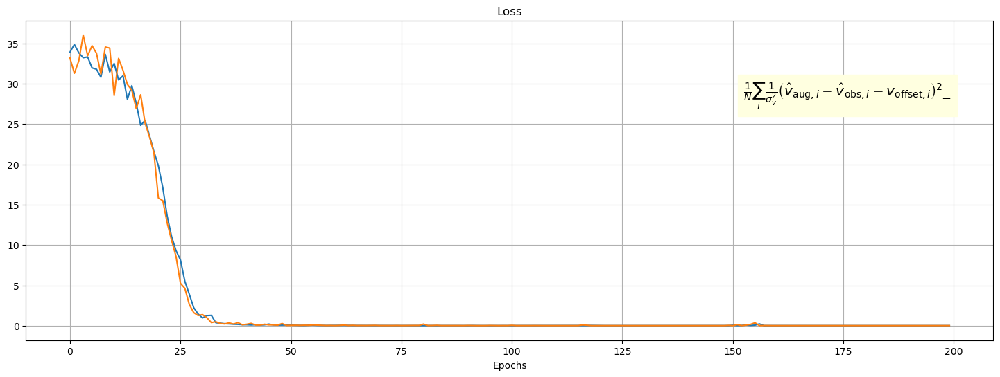

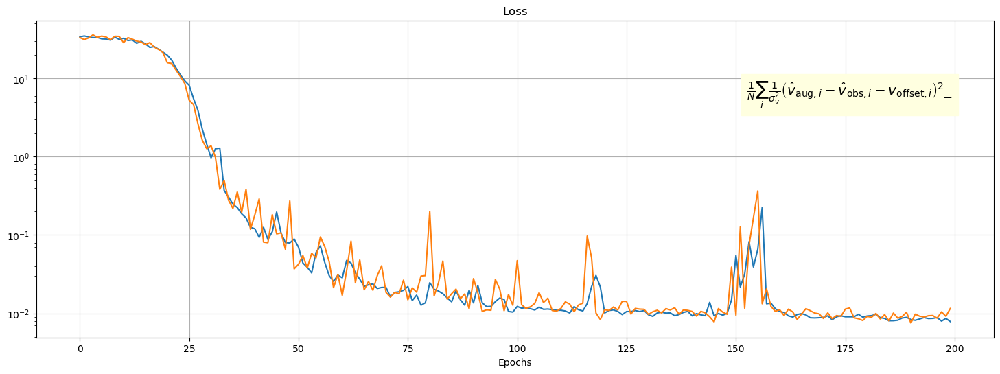

In [62]:
%matplotlib inline

plt.figure(figsize=(18, 6))
plt.title('Loss')
plt.xlabel('Epochs')
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.figtext(0.7, 0.7, s=r"$\frac{1}{N} \sum_i \frac{1}{\sigma_v^2} \left( \hat{v}_{\mathrm{aug}, i} - \hat{v}_{\mathrm{obs}, i} - v_{\mathrm{offset}, i} \right)^2$_", backgroundcolor='lightyellow', fontsize='x-large')
plt.grid()
plt.show()

plt.figure(figsize=(18, 6))
plt.title('Loss')
plt.xlabel('Epochs')
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.figtext(0.7, 0.7, s=r"$\frac{1}{N} \sum_i \frac{1}{\sigma_v^2} \left( \hat{v}_{\mathrm{aug}, i} - \hat{v}_{\mathrm{obs}, i} - v_{\mathrm{offset}, i} \right)^2$_", backgroundcolor='lightyellow', fontsize='x-large')
plt.yscale('log')
plt.grid()
plt.show()

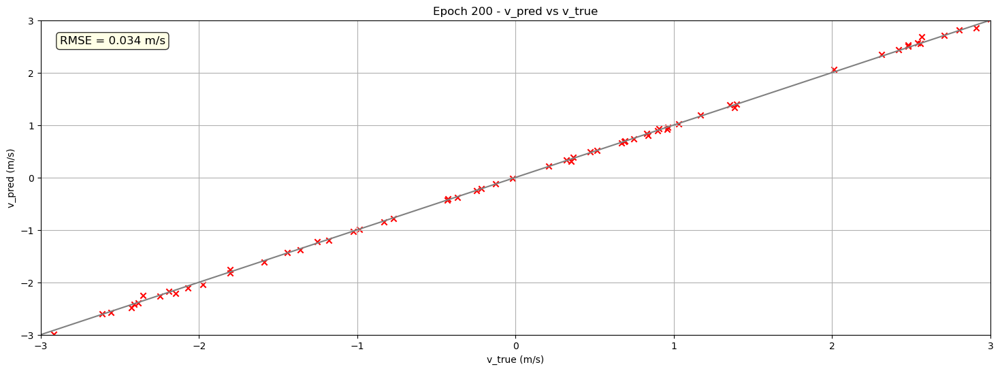

In [45]:
from matplotlib.animation import FuncAnimation

rmse_per_frame = []
for v_true, v_pred in zip(all_voffset_true, all_voffset_pred):
    rmse = torch.sqrt(torch.mean((v_true - v_pred) ** 2)).item()
    rmse_per_frame.append(rmse)

fig, ax = plt.subplots(figsize=(18, 6))
sc = ax.scatter([], [], marker='x', color='red')
line = ax.plot([], [], color='gray')[0]

# Création du text box : position relative (0.02, 0.95)
text_box = ax.text(0.02, 0.95, '', transform=ax.transAxes,
                   fontsize=12, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))

ax.grid()
ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)
ax.set_xlabel("v_true (m/s)")
ax.set_ylabel("v_pred (m/s)")
ax.set_title("Évolution v_pred vs v_true")

def update(frame):
    x = all_voffset_true[frame]
    y = all_voffset_pred[frame]
    rmse = rmse_per_frame[frame]

    sc.set_offsets(np.c_[x, y])
    line.set_data(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
    ax.set_title(f"Epoch {frame+1} - v_pred vs v_true")
    text_box.set_text(f"RMSE = {rmse:.3f} m/s")
    return sc, line


ani = FuncAnimation(fig, update, frames=len(all_voffset_pred), interval=300, blit=True)

# Pour afficher dans un notebook :
from IPython.display import HTML
HTML(ani.to_jshtml())

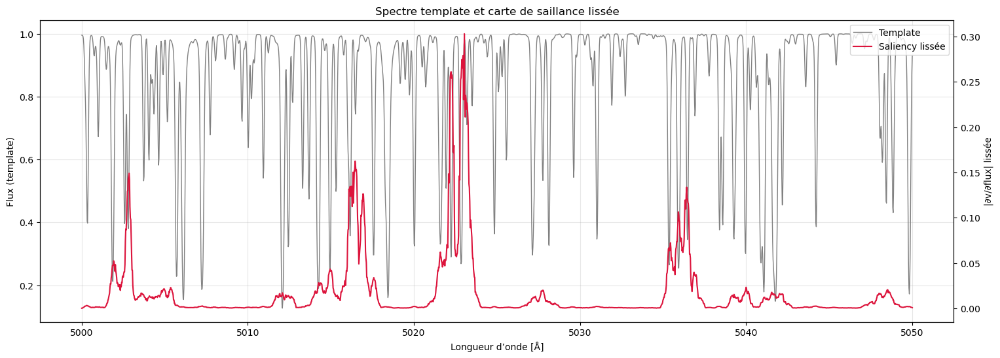

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# 1) Préparation de l’entrée et calcul de la saliency
y_obs = dataset.all_specs_torch[0].to(device)              # spectre brut
template = dataset.template_spec_torch.to(device)         # template
r_obs = (y_obs - template).unsqueeze(0)      # [1,1,L]
r_obs.requires_grad_()

v_pred = model(r_obs.float())                                     # prédiction
v_pred[0,0].backward()                                    # backprop

saliency = r_obs.grad.abs().detach().cpu().squeeze()      # [L]

saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())

# 2) Lissage par moyenne glissante
window = 11                                                # fenêtre impaire
kernel = np.ones(window) / window
saliency_smooth = np.convolve(saliency.numpy(), kernel, mode='same')

# 3) Tracé superposé template + saliency lissée
wave = dataset.wave_numpy

fig, ax1 = plt.subplots(figsize=(18,6))
ax1.plot(wave, dataset.template_spec_numpy, color='gray', lw=1, label='Template')
ax1.set_xlabel("Longueur d’onde [Å]")
ax1.set_ylabel("Flux (template)")
ax1.grid(alpha=0.3)

ax2 = ax1.twinx()
ax2.plot(wave, saliency_smooth, color='crimson', lw=1.5, label='Saliency lissée')
ax2.set_ylabel("|∂v/∂flux| lissée")

# Liens légende
lines, labels = ax1.get_lines() + ax2.get_lines(), [l.get_label() for l in ax1.get_lines()+ax2.get_lines()]
ax1.legend(lines, labels, loc='upper right')

plt.title("Spectre template et carte de saillance lissée")
plt.show()


- plot v_pred vs v_true (Modèle vs CCF)

- Etude comparative méthodes d'interp ?

- Etude comparative entre la CCF (bruit puis activité rajouté et voir si ça rajoute quelque chose à la CCF)

- Diminuer le nb de paramètres et voir l'impact sur les perfs ?

- Passage à l'échelle (spectre de 290 000 pts et sur le papier 2000 pts entrainé sur 50 A)

- Pourquoi ces pics dans la loss-log ?

- Regarder si les raies qui correspondent le plus à la salience sont des raies sensibles à l'activité stellaire